<div>
<h1 style="font-size: 30px; color:#54577C; align: center; text-shadow: 2px 3px  #d9cfd8;">American Sign Language <br>Image Classification using Convolutional Neural Network</h1>
<p>
    <font size=4px><font face="Product Sans Medium"><b><i>Elective 4 Deep Learning Project </i></b></font></font>
    <br><font face="Product Sans"><font color='#565b81'>Timothy Jonah E. Borromeo
    <br> Charlyn Jean Llamis
    <br> Sheena Candel
    <br> Jayve Senepete
    <br> Cherithy Villanueva
    <br> Nicole Mikka Daug
    </font></font>
</p>
    </div>
    </div>

<h2 style="font-size: 30px; color:#54577C; align: center; text-shadow: 2px 3px  #d9cfd8;">ETL</h2>
<p>
    <font size=3px><b>Importing our respective <code>libraries</code></b></font>
    <br><font size=3px><font face="Futura PT">
        </font></font>
</p>

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import models, transforms, datasets
from torchvision.utils import make_grid
import random
import shutil
from tqdm import tqdm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline

In [2]:
import os
import PIL

<h3 style="font-size: 20px; color:#0062ac; align: center; text-shadow: 2px 3px  #d9cfd8;"><font face ="Product Sans">Using OS to find folder path and files</font></h3>
<p>
    
</p>

In [3]:
dir = "../Project"
print(os.listdir(dir))

['.ipynb_checkpoints', 'asl-alphabet-classification-pytorch-Copy1.ipynb', 'asl-alphabet-classification-pytorch-Copy2.ipynb', 'asl-alphabet-classification-pytorch.ipynb', 'asl_alphabet', 'asl_alphabet - Copy', 'asl_alphabet_classification_pytorch_Final.ipynb', 'checkpoints', 'checkpoint_61.85.pth', 'checkpoint_75.28.pth', 'checkpoint_78.51', 'checkpoint_80.25.pth', 'checkpoint_84.24.pth', 'checkpoint_84.73', 'checkpoint_87.10', 'colab', 'Sign_Language.ipynb', 'sign_mnist', 'trash']


In [4]:
asl_dir = os.path.join(dir, "asl_alphabet - Copy")
print(os.listdir(asl_dir))

['asl_alphabet_test', 'asl_alphabet_train']


In [5]:
train_data_path = '../Project/asl_alphabet - Copy/asl_alphabet_train/asl_alphabet_train/'

#### File removing function <font size=1px>(For when in case to lessen the dataset)</font>

In [ ]:
# import random

# # root_folder = '/path/to/root/folder'
# num_images_to_delete_per_subfolder = 1500  # change this to the number of images you want to delete per subfolder

# # initialize a dictionary to keep track of the number of images deleted in each subfolder
# deleted_images_count = {}

# for root, dirs, files in os.walk(train_data_path):
#     image_files = []
#     for file in files:
#         if file.endswith('.jpg') or file.endswith('.png') or file.endswith('.jpeg'):
#             image_files.append(os.path.join(root, file))
#     random.shuffle(image_files)
#     for image_path in image_files:
#         if not root in deleted_images_count:
#             deleted_images_count[root] = 0
#         if deleted_images_count[root] >= num_images_to_delete_per_subfolder:
#             continue
#         os.remove(image_path)
#         deleted_images_count[root] += 1

In [ ]:
# num_images_to_delete = 1000  # change this to the number of images you want to delete

# # get a list of all image files in the root folder and its subfolders
# image_files = []
# for root, dirs, files in os.walk(train_data_path):
#     for file in files:
#         if file.endswith('.jpg') or file.endswith('.png') or file.endswith('.jpeg'):
#             image_files.append(os.path.join(root, file))

# # randomly select the specified number of images to delete
# images_to_delete = random.sample(image_files, num_images_to_delete)

# # delete the selected images
# for image in images_to_delete:
#     os.remove(image)

In [ ]:
# import os
# import shutil

# num_images_to_delete_per_subfolder = 123  # change this to the number of images you want to delete per subfolder

# deleted_images_count = {}

# # create a new directory in a current working directory
# trash_folder = os.path.join(os.getcwd(), 'trash')
# if not os.path.exists(trash_folder):
#     os.mkdir(trash_folder)

# for root, dirs, files in os.walk(train_data_path):
#     image_files = []
#     for file in files:
#         if file.endswith('.jpg') or file.endswith('.png') or file.endswith('.jpeg'):
#             image_files.append(os.path.join(root, file))
#     random.shuffle(image_files)
#     for image_path in image_files:
#         if not root in deleted_images_count:
#             deleted_images_count[root] = 0
#         if deleted_images_count[root] >= num_images_to_delete_per_subfolder:
#             continue
#         shutil.move(image_path, os.path.join(trash_folder, os.path.basename(image_path)))
#         deleted_images_count[root] += 1

Remove images to lessen the data

In [6]:
# import os
# import shutil



# num_images_to_delete_per_subfolder = 123  # change this to the number of images you want to delete per subfolder
# deleted_images_count = {}

# # create a new directory in a current working directory
# trash_folder = os.path.join(os.getcwd(), 'trash')
# if not os.path.exists(trash_folder):
#     os.mkdir(trash_folder)

# # a dictionary to store the original paths of the images
# original_paths = {}

# for root, dirs, files in os.walk(train_data_path):
#     image_files = []
#     for file in files:
#         if file.endswith('.jpg') or file.endswith('.png') or file.endswith('.jpeg'):
#             image_files.append(os.path.join(root, file))
#     random.shuffle(image_files)
#     for image_path in image_files:
#         if not root in deleted_images_count:
#             deleted_images_count[root] = 0
#         if deleted_images_count[root] >= num_images_to_delete_per_subfolder:
#             continue
#         # get the relative path from the root folder
#         rel_path = os.path.relpath(root, train_data_path)
#         # create the trash subfolder with the same path
#         trash_subfolder = os.path.join(trash_folder, rel_path)
#         os.makedirs(trash_subfolder, exist_ok=True)
#         # move the image to the trash subfolder
#         shutil.move(image_path, os.path.join(trash_subfolder, os.path.basename(image_path)))
#         deleted_images_count[root] += 1
#         original_paths[os.path.basename(image_path)] = image_path


only when u want to recover images

In [41]:
# trash_folder = os.path.join(os.getcwd(), 'trash')
# num_images_to_recover = 10 # change this to the number of images you want to recover

# # counter variable to keep track of the number of images moved
# counter = 0

# original_paths = {}  # dictionary to store the original paths of the images

# # move images back to their original subfolders
# for file_name in os.listdir(trash_folder):
#     if counter >= num_images_to_recover:
#         break
#     file_path = os.path.join(trash_folder, file_name)
#     if os.path.isfile(file_path) and file_name in original_paths:
#         shutil.move(file_path, original_paths[file_name])
#         counter += 1
#     elif os.path.isfile(file_path) and file_name not in original_paths:
#         print(f"{file_name} was not found in the original paths, skipping")


# ##########DONT USE###################
# # for file_name in os.listdir(trash_folder):
# #     if counter >= num_images_to_recover:
# #         break
# #     file_path = os.path.join(trash_folder, file_name)
# #     if os.path.isfile(file_path):
# #         # move the file back to its original location
# #         shutil.move(file_path, original_paths[file_name])
# #         counter += 1

A1.jpg was not found in the original paths, skipping
A10.jpg was not found in the original paths, skipping
A100.jpg was not found in the original paths, skipping
A1000.jpg was not found in the original paths, skipping
A1001.jpg was not found in the original paths, skipping
A1002.jpg was not found in the original paths, skipping
A1003.jpg was not found in the original paths, skipping
A1005.jpg was not found in the original paths, skipping
A1006.jpg was not found in the original paths, skipping
A1007.jpg was not found in the original paths, skipping
A1009.jpg was not found in the original paths, skipping
A101.jpg was not found in the original paths, skipping
A1011.jpg was not found in the original paths, skipping
A1012.jpg was not found in the original paths, skipping
A1013.jpg was not found in the original paths, skipping
A1014.jpg was not found in the original paths, skipping
A1015.jpg was not found in the original paths, skipping
A1016.jpg was not found in the original paths, skipping

A1815.jpg was not found in the original paths, skipping
A1816.jpg was not found in the original paths, skipping
A1817.jpg was not found in the original paths, skipping
A1818.jpg was not found in the original paths, skipping
A1819.jpg was not found in the original paths, skipping
A182.jpg was not found in the original paths, skipping
A1820.jpg was not found in the original paths, skipping
A1821.jpg was not found in the original paths, skipping
A1822.jpg was not found in the original paths, skipping
A1824.jpg was not found in the original paths, skipping
A1825.jpg was not found in the original paths, skipping
A1826.jpg was not found in the original paths, skipping
A1827.jpg was not found in the original paths, skipping
A1828.jpg was not found in the original paths, skipping
A1829.jpg was not found in the original paths, skipping
A1830.jpg was not found in the original paths, skipping
A1831.jpg was not found in the original paths, skipping
A1832.jpg was not found in the original paths, sk

A400.jpg was not found in the original paths, skipping
A401.jpg was not found in the original paths, skipping
A402.jpg was not found in the original paths, skipping
A403.jpg was not found in the original paths, skipping
A404.jpg was not found in the original paths, skipping
A405.jpg was not found in the original paths, skipping
A407.jpg was not found in the original paths, skipping
A408.jpg was not found in the original paths, skipping
A41.jpg was not found in the original paths, skipping
A410.jpg was not found in the original paths, skipping
A412.jpg was not found in the original paths, skipping
A414.jpg was not found in the original paths, skipping
A415.jpg was not found in the original paths, skipping
A416.jpg was not found in the original paths, skipping
A417.jpg was not found in the original paths, skipping
A418.jpg was not found in the original paths, skipping
A419.jpg was not found in the original paths, skipping
A42.jpg was not found in the original paths, skipping
A420.jpg was

B1694.jpg was not found in the original paths, skipping
B1695.jpg was not found in the original paths, skipping
B1696.jpg was not found in the original paths, skipping
B1698.jpg was not found in the original paths, skipping
B1699.jpg was not found in the original paths, skipping
B170.jpg was not found in the original paths, skipping
B1700.jpg was not found in the original paths, skipping
B1701.jpg was not found in the original paths, skipping
B1702.jpg was not found in the original paths, skipping
B1703.jpg was not found in the original paths, skipping
B1704.jpg was not found in the original paths, skipping
B1705.jpg was not found in the original paths, skipping
B1708.jpg was not found in the original paths, skipping
B1710.jpg was not found in the original paths, skipping
B1711.jpg was not found in the original paths, skipping
B1713.jpg was not found in the original paths, skipping
B1714.jpg was not found in the original paths, skipping
B1715.jpg was not found in the original paths, sk

B2922.jpg was not found in the original paths, skipping
B2923.jpg was not found in the original paths, skipping
B2925.jpg was not found in the original paths, skipping
B2926.jpg was not found in the original paths, skipping
B2927.jpg was not found in the original paths, skipping
B2928.jpg was not found in the original paths, skipping
B2929.jpg was not found in the original paths, skipping
B293.jpg was not found in the original paths, skipping
B2930.jpg was not found in the original paths, skipping
B2931.jpg was not found in the original paths, skipping
B2932.jpg was not found in the original paths, skipping
B2934.jpg was not found in the original paths, skipping
B2935.jpg was not found in the original paths, skipping
B2936.jpg was not found in the original paths, skipping
B2937.jpg was not found in the original paths, skipping
B2938.jpg was not found in the original paths, skipping
B2939.jpg was not found in the original paths, skipping
B294.jpg was not found in the original paths, ski

C1424.jpg was not found in the original paths, skipping
C1425.jpg was not found in the original paths, skipping
C1426.jpg was not found in the original paths, skipping
C1427.jpg was not found in the original paths, skipping
C1428.jpg was not found in the original paths, skipping
C1429.jpg was not found in the original paths, skipping
C143.jpg was not found in the original paths, skipping
C1430.jpg was not found in the original paths, skipping
C1431.jpg was not found in the original paths, skipping
C1432.jpg was not found in the original paths, skipping
C1433.jpg was not found in the original paths, skipping
C1434.jpg was not found in the original paths, skipping
C1436.jpg was not found in the original paths, skipping
C1437.jpg was not found in the original paths, skipping
C144.jpg was not found in the original paths, skipping
C1441.jpg was not found in the original paths, skipping
C1443.jpg was not found in the original paths, skipping
C1444.jpg was not found in the original paths, ski

C2614.jpg was not found in the original paths, skipping
C2615.jpg was not found in the original paths, skipping
C2616.jpg was not found in the original paths, skipping
C2617.jpg was not found in the original paths, skipping
C2618.jpg was not found in the original paths, skipping
C2619.jpg was not found in the original paths, skipping
C262.jpg was not found in the original paths, skipping
C2620.jpg was not found in the original paths, skipping
C2621.jpg was not found in the original paths, skipping
C2622.jpg was not found in the original paths, skipping
C2623.jpg was not found in the original paths, skipping
C2624.jpg was not found in the original paths, skipping
C2625.jpg was not found in the original paths, skipping
C2626.jpg was not found in the original paths, skipping
C2627.jpg was not found in the original paths, skipping
C2628.jpg was not found in the original paths, skipping
C2629.jpg was not found in the original paths, skipping
C2630.jpg was not found in the original paths, sk

D102.jpg was not found in the original paths, skipping
D1020.jpg was not found in the original paths, skipping
D1021.jpg was not found in the original paths, skipping
D1022.jpg was not found in the original paths, skipping
D1023.jpg was not found in the original paths, skipping
D1024.jpg was not found in the original paths, skipping
D1025.jpg was not found in the original paths, skipping
D1026.jpg was not found in the original paths, skipping
D1027.jpg was not found in the original paths, skipping
D1028.jpg was not found in the original paths, skipping
D1029.jpg was not found in the original paths, skipping
D103.jpg was not found in the original paths, skipping
D1030.jpg was not found in the original paths, skipping
D1031.jpg was not found in the original paths, skipping
D1032.jpg was not found in the original paths, skipping
D1033.jpg was not found in the original paths, skipping
D1034.jpg was not found in the original paths, skipping
D1035.jpg was not found in the original paths, ski

D2262.jpg was not found in the original paths, skipping
D2264.jpg was not found in the original paths, skipping
D2265.jpg was not found in the original paths, skipping
D2266.jpg was not found in the original paths, skipping
D2267.jpg was not found in the original paths, skipping
D2268.jpg was not found in the original paths, skipping
D227.jpg was not found in the original paths, skipping
D2271.jpg was not found in the original paths, skipping
D2273.jpg was not found in the original paths, skipping
D2274.jpg was not found in the original paths, skipping
D2277.jpg was not found in the original paths, skipping
D2278.jpg was not found in the original paths, skipping
D2279.jpg was not found in the original paths, skipping
D228.jpg was not found in the original paths, skipping
D2280.jpg was not found in the original paths, skipping
D2281.jpg was not found in the original paths, skipping
D2283.jpg was not found in the original paths, skipping
D2284.jpg was not found in the original paths, ski

D662.jpg was not found in the original paths, skipping
D663.jpg was not found in the original paths, skipping
D664.jpg was not found in the original paths, skipping
D665.jpg was not found in the original paths, skipping
D666.jpg was not found in the original paths, skipping
D667.jpg was not found in the original paths, skipping
D668.jpg was not found in the original paths, skipping
D669.jpg was not found in the original paths, skipping
D67.jpg was not found in the original paths, skipping
D670.jpg was not found in the original paths, skipping
D671.jpg was not found in the original paths, skipping
D672.jpg was not found in the original paths, skipping
D674.jpg was not found in the original paths, skipping
D675.jpg was not found in the original paths, skipping
D676.jpg was not found in the original paths, skipping
D677.jpg was not found in the original paths, skipping
D678.jpg was not found in the original paths, skipping
D68.jpg was not found in the original paths, skipping
D680.jpg was

del1600.jpg was not found in the original paths, skipping
del1601.jpg was not found in the original paths, skipping
del1604.jpg was not found in the original paths, skipping
del1606.jpg was not found in the original paths, skipping
del1607.jpg was not found in the original paths, skipping
del1608.jpg was not found in the original paths, skipping
del1609.jpg was not found in the original paths, skipping
del161.jpg was not found in the original paths, skipping
del1610.jpg was not found in the original paths, skipping
del1611.jpg was not found in the original paths, skipping
del1612.jpg was not found in the original paths, skipping
del1613.jpg was not found in the original paths, skipping
del1614.jpg was not found in the original paths, skipping
del1615.jpg was not found in the original paths, skipping
del1616.jpg was not found in the original paths, skipping
del1617.jpg was not found in the original paths, skipping
del1618.jpg was not found in the original paths, skipping
del1619.jpg was

del2759.jpg was not found in the original paths, skipping
del276.jpg was not found in the original paths, skipping
del2760.jpg was not found in the original paths, skipping
del2762.jpg was not found in the original paths, skipping
del2763.jpg was not found in the original paths, skipping
del2764.jpg was not found in the original paths, skipping
del2766.jpg was not found in the original paths, skipping
del2767.jpg was not found in the original paths, skipping
del2768.jpg was not found in the original paths, skipping
del2769.jpg was not found in the original paths, skipping
del277.jpg was not found in the original paths, skipping
del2770.jpg was not found in the original paths, skipping
del2771.jpg was not found in the original paths, skipping
del2772.jpg was not found in the original paths, skipping
del2773.jpg was not found in the original paths, skipping
del2774.jpg was not found in the original paths, skipping
del2775.jpg was not found in the original paths, skipping
del2776.jpg was 

E1130.jpg was not found in the original paths, skipping
E1131.jpg was not found in the original paths, skipping
E1132.jpg was not found in the original paths, skipping
E1133.jpg was not found in the original paths, skipping
E1134.jpg was not found in the original paths, skipping
E1135.jpg was not found in the original paths, skipping
E1136.jpg was not found in the original paths, skipping
E1137.jpg was not found in the original paths, skipping
E1139.jpg was not found in the original paths, skipping
E114.jpg was not found in the original paths, skipping
E1140.jpg was not found in the original paths, skipping
E1141.jpg was not found in the original paths, skipping
E1142.jpg was not found in the original paths, skipping
E1143.jpg was not found in the original paths, skipping
E1144.jpg was not found in the original paths, skipping
E1145.jpg was not found in the original paths, skipping
E1146.jpg was not found in the original paths, skipping
E1147.jpg was not found in the original paths, sk

E2163.jpg was not found in the original paths, skipping
E2165.jpg was not found in the original paths, skipping
E2166.jpg was not found in the original paths, skipping
E2167.jpg was not found in the original paths, skipping
E2168.jpg was not found in the original paths, skipping
E2169.jpg was not found in the original paths, skipping
E217.jpg was not found in the original paths, skipping
E2170.jpg was not found in the original paths, skipping
E2173.jpg was not found in the original paths, skipping
E2175.jpg was not found in the original paths, skipping
E2176.jpg was not found in the original paths, skipping
E2177.jpg was not found in the original paths, skipping
E2178.jpg was not found in the original paths, skipping
E2179.jpg was not found in the original paths, skipping
E218.jpg was not found in the original paths, skipping
E2180.jpg was not found in the original paths, skipping
E2181.jpg was not found in the original paths, skipping
E2182.jpg was not found in the original paths, ski

E600.jpg was not found in the original paths, skipping
E601.jpg was not found in the original paths, skipping
E602.jpg was not found in the original paths, skipping
E603.jpg was not found in the original paths, skipping
E604.jpg was not found in the original paths, skipping
E605.jpg was not found in the original paths, skipping
E606.jpg was not found in the original paths, skipping
E607.jpg was not found in the original paths, skipping
E609.jpg was not found in the original paths, skipping
E61.jpg was not found in the original paths, skipping
E610.jpg was not found in the original paths, skipping
E611.jpg was not found in the original paths, skipping
E612.jpg was not found in the original paths, skipping
E613.jpg was not found in the original paths, skipping
E614.jpg was not found in the original paths, skipping
E615.jpg was not found in the original paths, skipping
E618.jpg was not found in the original paths, skipping
E619.jpg was not found in the original paths, skipping
E62.jpg was

F1742.jpg was not found in the original paths, skipping
F1743.jpg was not found in the original paths, skipping
F1744.jpg was not found in the original paths, skipping
F1745.jpg was not found in the original paths, skipping
F1746.jpg was not found in the original paths, skipping
F1747.jpg was not found in the original paths, skipping
F1748.jpg was not found in the original paths, skipping
F1749.jpg was not found in the original paths, skipping
F175.jpg was not found in the original paths, skipping
F1752.jpg was not found in the original paths, skipping
F1753.jpg was not found in the original paths, skipping
F1754.jpg was not found in the original paths, skipping
F1755.jpg was not found in the original paths, skipping
F1756.jpg was not found in the original paths, skipping
F176.jpg was not found in the original paths, skipping
F1760.jpg was not found in the original paths, skipping
F1761.jpg was not found in the original paths, skipping
F1762.jpg was not found in the original paths, ski

F2947.jpg was not found in the original paths, skipping
F2948.jpg was not found in the original paths, skipping
F2949.jpg was not found in the original paths, skipping
F295.jpg was not found in the original paths, skipping
F2951.jpg was not found in the original paths, skipping
F2952.jpg was not found in the original paths, skipping
F2953.jpg was not found in the original paths, skipping
F2954.jpg was not found in the original paths, skipping
F2955.jpg was not found in the original paths, skipping
F2956.jpg was not found in the original paths, skipping
F2957.jpg was not found in the original paths, skipping
F2959.jpg was not found in the original paths, skipping
F296.jpg was not found in the original paths, skipping
F2960.jpg was not found in the original paths, skipping
F2963.jpg was not found in the original paths, skipping
F2964.jpg was not found in the original paths, skipping
F2965.jpg was not found in the original paths, skipping
F2966.jpg was not found in the original paths, ski

G1272.jpg was not found in the original paths, skipping
G1273.jpg was not found in the original paths, skipping
G1275.jpg was not found in the original paths, skipping
G1276.jpg was not found in the original paths, skipping
G1277.jpg was not found in the original paths, skipping
G1278.jpg was not found in the original paths, skipping
G1279.jpg was not found in the original paths, skipping
G128.jpg was not found in the original paths, skipping
G1280.jpg was not found in the original paths, skipping
G1281.jpg was not found in the original paths, skipping
G1282.jpg was not found in the original paths, skipping
G1283.jpg was not found in the original paths, skipping
G1284.jpg was not found in the original paths, skipping
G1285.jpg was not found in the original paths, skipping
G1286.jpg was not found in the original paths, skipping
G1287.jpg was not found in the original paths, skipping
G1288.jpg was not found in the original paths, skipping
G1289.jpg was not found in the original paths, sk

G2408.jpg was not found in the original paths, skipping
G2409.jpg was not found in the original paths, skipping
G241.jpg was not found in the original paths, skipping
G2410.jpg was not found in the original paths, skipping
G2411.jpg was not found in the original paths, skipping
G2412.jpg was not found in the original paths, skipping
G2413.jpg was not found in the original paths, skipping
G2414.jpg was not found in the original paths, skipping
G2415.jpg was not found in the original paths, skipping
G2416.jpg was not found in the original paths, skipping
G2418.jpg was not found in the original paths, skipping
G2419.jpg was not found in the original paths, skipping
G242.jpg was not found in the original paths, skipping
G2420.jpg was not found in the original paths, skipping
G2422.jpg was not found in the original paths, skipping
G2423.jpg was not found in the original paths, skipping
G2424.jpg was not found in the original paths, skipping
G2425.jpg was not found in the original paths, ski

G804.jpg was not found in the original paths, skipping
G805.jpg was not found in the original paths, skipping
G806.jpg was not found in the original paths, skipping
G808.jpg was not found in the original paths, skipping
G809.jpg was not found in the original paths, skipping
G81.jpg was not found in the original paths, skipping
G810.jpg was not found in the original paths, skipping
G811.jpg was not found in the original paths, skipping
G812.jpg was not found in the original paths, skipping
G813.jpg was not found in the original paths, skipping
G814.jpg was not found in the original paths, skipping
G815.jpg was not found in the original paths, skipping
G816.jpg was not found in the original paths, skipping
G817.jpg was not found in the original paths, skipping
G818.jpg was not found in the original paths, skipping
G819.jpg was not found in the original paths, skipping
G82.jpg was not found in the original paths, skipping
G820.jpg was not found in the original paths, skipping
G821.jpg was

H189.jpg was not found in the original paths, skipping
H1890.jpg was not found in the original paths, skipping
H1891.jpg was not found in the original paths, skipping
H1892.jpg was not found in the original paths, skipping
H1893.jpg was not found in the original paths, skipping
H1894.jpg was not found in the original paths, skipping
H1895.jpg was not found in the original paths, skipping
H1896.jpg was not found in the original paths, skipping
H1897.jpg was not found in the original paths, skipping
H1898.jpg was not found in the original paths, skipping
H1899.jpg was not found in the original paths, skipping
H19.jpg was not found in the original paths, skipping
H1900.jpg was not found in the original paths, skipping
H1902.jpg was not found in the original paths, skipping
H1903.jpg was not found in the original paths, skipping
H1904.jpg was not found in the original paths, skipping
H1905.jpg was not found in the original paths, skipping
H1906.jpg was not found in the original paths, skip

H382.jpg was not found in the original paths, skipping
H383.jpg was not found in the original paths, skipping
H384.jpg was not found in the original paths, skipping
H385.jpg was not found in the original paths, skipping
H386.jpg was not found in the original paths, skipping
H387.jpg was not found in the original paths, skipping
H388.jpg was not found in the original paths, skipping
H389.jpg was not found in the original paths, skipping
H39.jpg was not found in the original paths, skipping
H390.jpg was not found in the original paths, skipping
H391.jpg was not found in the original paths, skipping
H392.jpg was not found in the original paths, skipping
H393.jpg was not found in the original paths, skipping
H394.jpg was not found in the original paths, skipping
H395.jpg was not found in the original paths, skipping
H396.jpg was not found in the original paths, skipping
H397.jpg was not found in the original paths, skipping
H398.jpg was not found in the original paths, skipping
H399.jpg wa

I1389.jpg was not found in the original paths, skipping
I139.jpg was not found in the original paths, skipping
I1390.jpg was not found in the original paths, skipping
I1391.jpg was not found in the original paths, skipping
I1394.jpg was not found in the original paths, skipping
I1395.jpg was not found in the original paths, skipping
I1397.jpg was not found in the original paths, skipping
I1399.jpg was not found in the original paths, skipping
I14.jpg was not found in the original paths, skipping
I140.jpg was not found in the original paths, skipping
I1400.jpg was not found in the original paths, skipping
I1401.jpg was not found in the original paths, skipping
I1402.jpg was not found in the original paths, skipping
I1403.jpg was not found in the original paths, skipping
I1404.jpg was not found in the original paths, skipping
I1405.jpg was not found in the original paths, skipping
I1407.jpg was not found in the original paths, skipping
I1408.jpg was not found in the original paths, skipp

I2082.jpg was not found in the original paths, skipping
I2083.jpg was not found in the original paths, skipping
I2084.jpg was not found in the original paths, skipping
I2085.jpg was not found in the original paths, skipping
I2086.jpg was not found in the original paths, skipping
I2087.jpg was not found in the original paths, skipping
I2088.jpg was not found in the original paths, skipping
I2089.jpg was not found in the original paths, skipping
I209.jpg was not found in the original paths, skipping
I2090.jpg was not found in the original paths, skipping
I2091.jpg was not found in the original paths, skipping
I2092.jpg was not found in the original paths, skipping
I2093.jpg was not found in the original paths, skipping
I2094.jpg was not found in the original paths, skipping
I2095.jpg was not found in the original paths, skipping
I2097.jpg was not found in the original paths, skipping
I2098.jpg was not found in the original paths, skipping
I21.jpg was not found in the original paths, skip

I583.jpg was not found in the original paths, skipping
I584.jpg was not found in the original paths, skipping
I586.jpg was not found in the original paths, skipping
I587.jpg was not found in the original paths, skipping
I588.jpg was not found in the original paths, skipping
I589.jpg was not found in the original paths, skipping
I59.jpg was not found in the original paths, skipping
I590.jpg was not found in the original paths, skipping
I591.jpg was not found in the original paths, skipping
I592.jpg was not found in the original paths, skipping
I593.jpg was not found in the original paths, skipping
I594.jpg was not found in the original paths, skipping
I595.jpg was not found in the original paths, skipping
I596.jpg was not found in the original paths, skipping
I597.jpg was not found in the original paths, skipping
I598.jpg was not found in the original paths, skipping
I599.jpg was not found in the original paths, skipping
I6.jpg was not found in the original paths, skipping
I60.jpg was n

J189.jpg was not found in the original paths, skipping
J1890.jpg was not found in the original paths, skipping
J1891.jpg was not found in the original paths, skipping
J1892.jpg was not found in the original paths, skipping
J1893.jpg was not found in the original paths, skipping
J1894.jpg was not found in the original paths, skipping
J1895.jpg was not found in the original paths, skipping
J1896.jpg was not found in the original paths, skipping
J1897.jpg was not found in the original paths, skipping
J1898.jpg was not found in the original paths, skipping
J1899.jpg was not found in the original paths, skipping
J19.jpg was not found in the original paths, skipping
J1900.jpg was not found in the original paths, skipping
J1902.jpg was not found in the original paths, skipping
J1903.jpg was not found in the original paths, skipping
J1904.jpg was not found in the original paths, skipping
J1906.jpg was not found in the original paths, skipping
J1907.jpg was not found in the original paths, skip

J439.jpg was not found in the original paths, skipping
J440.jpg was not found in the original paths, skipping
J441.jpg was not found in the original paths, skipping
J442.jpg was not found in the original paths, skipping
J443.jpg was not found in the original paths, skipping
J446.jpg was not found in the original paths, skipping
J447.jpg was not found in the original paths, skipping
J448.jpg was not found in the original paths, skipping
J450.jpg was not found in the original paths, skipping
J451.jpg was not found in the original paths, skipping
J452.jpg was not found in the original paths, skipping
J453.jpg was not found in the original paths, skipping
J454.jpg was not found in the original paths, skipping
J455.jpg was not found in the original paths, skipping
J456.jpg was not found in the original paths, skipping
J457.jpg was not found in the original paths, skipping
J459.jpg was not found in the original paths, skipping
J46.jpg was not found in the original paths, skipping
J460.jpg wa

K1606.jpg was not found in the original paths, skipping
K1607.jpg was not found in the original paths, skipping
K1608.jpg was not found in the original paths, skipping
K1609.jpg was not found in the original paths, skipping
K161.jpg was not found in the original paths, skipping
K1610.jpg was not found in the original paths, skipping
K1611.jpg was not found in the original paths, skipping
K1612.jpg was not found in the original paths, skipping
K1613.jpg was not found in the original paths, skipping
K1614.jpg was not found in the original paths, skipping
K1615.jpg was not found in the original paths, skipping
K1616.jpg was not found in the original paths, skipping
K1617.jpg was not found in the original paths, skipping
K1618.jpg was not found in the original paths, skipping
K1619.jpg was not found in the original paths, skipping
K162.jpg was not found in the original paths, skipping
K1620.jpg was not found in the original paths, skipping
K1621.jpg was not found in the original paths, ski

K2774.jpg was not found in the original paths, skipping
K2775.jpg was not found in the original paths, skipping
K2776.jpg was not found in the original paths, skipping
K2777.jpg was not found in the original paths, skipping
K2778.jpg was not found in the original paths, skipping
K2779.jpg was not found in the original paths, skipping
K278.jpg was not found in the original paths, skipping
K2780.jpg was not found in the original paths, skipping
K2783.jpg was not found in the original paths, skipping
K2784.jpg was not found in the original paths, skipping
K2785.jpg was not found in the original paths, skipping
K2786.jpg was not found in the original paths, skipping
K2787.jpg was not found in the original paths, skipping
K2788.jpg was not found in the original paths, skipping
K2789.jpg was not found in the original paths, skipping
K279.jpg was not found in the original paths, skipping
K2790.jpg was not found in the original paths, skipping
K2791.jpg was not found in the original paths, ski

L1306.jpg was not found in the original paths, skipping
L1308.jpg was not found in the original paths, skipping
L1309.jpg was not found in the original paths, skipping
L131.jpg was not found in the original paths, skipping
L1310.jpg was not found in the original paths, skipping
L1311.jpg was not found in the original paths, skipping
L1313.jpg was not found in the original paths, skipping
L1314.jpg was not found in the original paths, skipping
L1315.jpg was not found in the original paths, skipping
L1317.jpg was not found in the original paths, skipping
L1318.jpg was not found in the original paths, skipping
L1319.jpg was not found in the original paths, skipping
L132.jpg was not found in the original paths, skipping
L1320.jpg was not found in the original paths, skipping
L1322.jpg was not found in the original paths, skipping
L1323.jpg was not found in the original paths, skipping
L1324.jpg was not found in the original paths, skipping
L1325.jpg was not found in the original paths, ski

L2482.jpg was not found in the original paths, skipping
L2483.jpg was not found in the original paths, skipping
L2484.jpg was not found in the original paths, skipping
L2485.jpg was not found in the original paths, skipping
L2487.jpg was not found in the original paths, skipping
L2488.jpg was not found in the original paths, skipping
L249.jpg was not found in the original paths, skipping
L2490.jpg was not found in the original paths, skipping
L2492.jpg was not found in the original paths, skipping
L2493.jpg was not found in the original paths, skipping
L2494.jpg was not found in the original paths, skipping
L2495.jpg was not found in the original paths, skipping
L2496.jpg was not found in the original paths, skipping
L2498.jpg was not found in the original paths, skipping
L2499.jpg was not found in the original paths, skipping
L25.jpg was not found in the original paths, skipping
L250.jpg was not found in the original paths, skipping
L2501.jpg was not found in the original paths, skipp

L978.jpg was not found in the original paths, skipping
L98.jpg was not found in the original paths, skipping
L981.jpg was not found in the original paths, skipping
L982.jpg was not found in the original paths, skipping
L983.jpg was not found in the original paths, skipping
L984.jpg was not found in the original paths, skipping
L985.jpg was not found in the original paths, skipping
L986.jpg was not found in the original paths, skipping
L987.jpg was not found in the original paths, skipping
L988.jpg was not found in the original paths, skipping
L989.jpg was not found in the original paths, skipping
L99.jpg was not found in the original paths, skipping
L990.jpg was not found in the original paths, skipping
L992.jpg was not found in the original paths, skipping
L993.jpg was not found in the original paths, skipping
L994.jpg was not found in the original paths, skipping
L996.jpg was not found in the original paths, skipping
L997.jpg was not found in the original paths, skipping
L998.jpg was

M2225.jpg was not found in the original paths, skipping
M2226.jpg was not found in the original paths, skipping
M2227.jpg was not found in the original paths, skipping
M2228.jpg was not found in the original paths, skipping
M2229.jpg was not found in the original paths, skipping
M223.jpg was not found in the original paths, skipping
M2230.jpg was not found in the original paths, skipping
M2232.jpg was not found in the original paths, skipping
M2233.jpg was not found in the original paths, skipping
M2234.jpg was not found in the original paths, skipping
M2235.jpg was not found in the original paths, skipping
M2236.jpg was not found in the original paths, skipping
M2238.jpg was not found in the original paths, skipping
M2239.jpg was not found in the original paths, skipping
M224.jpg was not found in the original paths, skipping
M2242.jpg was not found in the original paths, skipping
M2243.jpg was not found in the original paths, skipping
M2245.jpg was not found in the original paths, ski

M738.jpg was not found in the original paths, skipping
M739.jpg was not found in the original paths, skipping
M740.jpg was not found in the original paths, skipping
M741.jpg was not found in the original paths, skipping
M743.jpg was not found in the original paths, skipping
M744.jpg was not found in the original paths, skipping
M745.jpg was not found in the original paths, skipping
M746.jpg was not found in the original paths, skipping
M747.jpg was not found in the original paths, skipping
M748.jpg was not found in the original paths, skipping
M749.jpg was not found in the original paths, skipping
M75.jpg was not found in the original paths, skipping
M750.jpg was not found in the original paths, skipping
M751.jpg was not found in the original paths, skipping
M755.jpg was not found in the original paths, skipping
M756.jpg was not found in the original paths, skipping
M757.jpg was not found in the original paths, skipping
M759.jpg was not found in the original paths, skipping
M76.jpg was

N1993.jpg was not found in the original paths, skipping
N1995.jpg was not found in the original paths, skipping
N1997.jpg was not found in the original paths, skipping
N1998.jpg was not found in the original paths, skipping
N1999.jpg was not found in the original paths, skipping
N2.jpg was not found in the original paths, skipping
N20.jpg was not found in the original paths, skipping
N200.jpg was not found in the original paths, skipping
N2001.jpg was not found in the original paths, skipping
N2002.jpg was not found in the original paths, skipping
N2003.jpg was not found in the original paths, skipping
N2005.jpg was not found in the original paths, skipping
N2006.jpg was not found in the original paths, skipping
N2007.jpg was not found in the original paths, skipping
N2008.jpg was not found in the original paths, skipping
N2009.jpg was not found in the original paths, skipping
N201.jpg was not found in the original paths, skipping
N2010.jpg was not found in the original paths, skipping

N535.jpg was not found in the original paths, skipping
N536.jpg was not found in the original paths, skipping
N537.jpg was not found in the original paths, skipping
N538.jpg was not found in the original paths, skipping
N539.jpg was not found in the original paths, skipping
N54.jpg was not found in the original paths, skipping
N540.jpg was not found in the original paths, skipping
N541.jpg was not found in the original paths, skipping
N542.jpg was not found in the original paths, skipping
N543.jpg was not found in the original paths, skipping
N545.jpg was not found in the original paths, skipping
N546.jpg was not found in the original paths, skipping
N547.jpg was not found in the original paths, skipping
N548.jpg was not found in the original paths, skipping
N549.jpg was not found in the original paths, skipping
N55.jpg was not found in the original paths, skipping
N550.jpg was not found in the original paths, skipping
N551.jpg was not found in the original paths, skipping
N552.jpg was

nothing1929.jpg was not found in the original paths, skipping
nothing193.jpg was not found in the original paths, skipping
nothing1930.jpg was not found in the original paths, skipping
nothing1931.jpg was not found in the original paths, skipping
nothing1932.jpg was not found in the original paths, skipping
nothing1934.jpg was not found in the original paths, skipping
nothing1935.jpg was not found in the original paths, skipping
nothing1936.jpg was not found in the original paths, skipping
nothing1939.jpg was not found in the original paths, skipping
nothing194.jpg was not found in the original paths, skipping
nothing1941.jpg was not found in the original paths, skipping
nothing1942.jpg was not found in the original paths, skipping
nothing1944.jpg was not found in the original paths, skipping
nothing1945.jpg was not found in the original paths, skipping
nothing1946.jpg was not found in the original paths, skipping
nothing1947.jpg was not found in the original paths, skipping
nothing194

nothing549.jpg was not found in the original paths, skipping
nothing55.jpg was not found in the original paths, skipping
nothing550.jpg was not found in the original paths, skipping
nothing552.jpg was not found in the original paths, skipping
nothing556.jpg was not found in the original paths, skipping
nothing557.jpg was not found in the original paths, skipping
nothing558.jpg was not found in the original paths, skipping
nothing559.jpg was not found in the original paths, skipping
nothing56.jpg was not found in the original paths, skipping
nothing560.jpg was not found in the original paths, skipping
nothing561.jpg was not found in the original paths, skipping
nothing563.jpg was not found in the original paths, skipping
nothing564.jpg was not found in the original paths, skipping
nothing565.jpg was not found in the original paths, skipping
nothing566.jpg was not found in the original paths, skipping
nothing567.jpg was not found in the original paths, skipping
nothing568.jpg was not fou

O1567.jpg was not found in the original paths, skipping
O1568.jpg was not found in the original paths, skipping
O1569.jpg was not found in the original paths, skipping
O1570.jpg was not found in the original paths, skipping
O1571.jpg was not found in the original paths, skipping
O1572.jpg was not found in the original paths, skipping
O1575.jpg was not found in the original paths, skipping
O1576.jpg was not found in the original paths, skipping
O1577.jpg was not found in the original paths, skipping
O1578.jpg was not found in the original paths, skipping
O1579.jpg was not found in the original paths, skipping
O158.jpg was not found in the original paths, skipping
O1583.jpg was not found in the original paths, skipping
O1584.jpg was not found in the original paths, skipping
O1585.jpg was not found in the original paths, skipping
O1586.jpg was not found in the original paths, skipping
O1587.jpg was not found in the original paths, skipping
O1588.jpg was not found in the original paths, sk

O2741.jpg was not found in the original paths, skipping
O2742.jpg was not found in the original paths, skipping
O2743.jpg was not found in the original paths, skipping
O2744.jpg was not found in the original paths, skipping
O2745.jpg was not found in the original paths, skipping
O2746.jpg was not found in the original paths, skipping
O2747.jpg was not found in the original paths, skipping
O2749.jpg was not found in the original paths, skipping
O275.jpg was not found in the original paths, skipping
O2750.jpg was not found in the original paths, skipping
O2752.jpg was not found in the original paths, skipping
O2753.jpg was not found in the original paths, skipping
O2755.jpg was not found in the original paths, skipping
O2756.jpg was not found in the original paths, skipping
O2759.jpg was not found in the original paths, skipping
O276.jpg was not found in the original paths, skipping
O2760.jpg was not found in the original paths, skipping
O2761.jpg was not found in the original paths, ski

P12.jpg was not found in the original paths, skipping
P120.jpg was not found in the original paths, skipping
P1200.jpg was not found in the original paths, skipping
P1201.jpg was not found in the original paths, skipping
P1202.jpg was not found in the original paths, skipping
P1204.jpg was not found in the original paths, skipping
P1205.jpg was not found in the original paths, skipping
P1206.jpg was not found in the original paths, skipping
P1207.jpg was not found in the original paths, skipping
P1208.jpg was not found in the original paths, skipping
P1209.jpg was not found in the original paths, skipping
P121.jpg was not found in the original paths, skipping
P1210.jpg was not found in the original paths, skipping
P1211.jpg was not found in the original paths, skipping
P1212.jpg was not found in the original paths, skipping
P1213.jpg was not found in the original paths, skipping
P1214.jpg was not found in the original paths, skipping
P1215.jpg was not found in the original paths, skipp

P2368.jpg was not found in the original paths, skipping
P2369.jpg was not found in the original paths, skipping
P237.jpg was not found in the original paths, skipping
P2370.jpg was not found in the original paths, skipping
P2371.jpg was not found in the original paths, skipping
P2372.jpg was not found in the original paths, skipping
P2373.jpg was not found in the original paths, skipping
P2374.jpg was not found in the original paths, skipping
P2375.jpg was not found in the original paths, skipping
P2377.jpg was not found in the original paths, skipping
P2378.jpg was not found in the original paths, skipping
P2379.jpg was not found in the original paths, skipping
P238.jpg was not found in the original paths, skipping
P2380.jpg was not found in the original paths, skipping
P2381.jpg was not found in the original paths, skipping
P2382.jpg was not found in the original paths, skipping
P2383.jpg was not found in the original paths, skipping
P2384.jpg was not found in the original paths, ski

P847.jpg was not found in the original paths, skipping
P848.jpg was not found in the original paths, skipping
P849.jpg was not found in the original paths, skipping
P85.jpg was not found in the original paths, skipping
P852.jpg was not found in the original paths, skipping
P853.jpg was not found in the original paths, skipping
P854.jpg was not found in the original paths, skipping
P856.jpg was not found in the original paths, skipping
P857.jpg was not found in the original paths, skipping
P858.jpg was not found in the original paths, skipping
P859.jpg was not found in the original paths, skipping
P86.jpg was not found in the original paths, skipping
P861.jpg was not found in the original paths, skipping
P862.jpg was not found in the original paths, skipping
P864.jpg was not found in the original paths, skipping
P865.jpg was not found in the original paths, skipping
P866.jpg was not found in the original paths, skipping
P867.jpg was not found in the original paths, skipping
P868.jpg was

Q2025.jpg was not found in the original paths, skipping
Q2026.jpg was not found in the original paths, skipping
Q2027.jpg was not found in the original paths, skipping
Q2028.jpg was not found in the original paths, skipping
Q2029.jpg was not found in the original paths, skipping
Q203.jpg was not found in the original paths, skipping
Q2030.jpg was not found in the original paths, skipping
Q2031.jpg was not found in the original paths, skipping
Q2032.jpg was not found in the original paths, skipping
Q2033.jpg was not found in the original paths, skipping
Q2034.jpg was not found in the original paths, skipping
Q2035.jpg was not found in the original paths, skipping
Q2036.jpg was not found in the original paths, skipping
Q2037.jpg was not found in the original paths, skipping
Q2038.jpg was not found in the original paths, skipping
Q2039.jpg was not found in the original paths, skipping
Q204.jpg was not found in the original paths, skipping
Q2040.jpg was not found in the original paths, ski

Q505.jpg was not found in the original paths, skipping
Q506.jpg was not found in the original paths, skipping
Q507.jpg was not found in the original paths, skipping
Q508.jpg was not found in the original paths, skipping
Q509.jpg was not found in the original paths, skipping
Q51.jpg was not found in the original paths, skipping
Q511.jpg was not found in the original paths, skipping
Q512.jpg was not found in the original paths, skipping
Q513.jpg was not found in the original paths, skipping
Q515.jpg was not found in the original paths, skipping
Q516.jpg was not found in the original paths, skipping
Q517.jpg was not found in the original paths, skipping
Q518.jpg was not found in the original paths, skipping
Q519.jpg was not found in the original paths, skipping
Q52.jpg was not found in the original paths, skipping
Q520.jpg was not found in the original paths, skipping
Q522.jpg was not found in the original paths, skipping
Q523.jpg was not found in the original paths, skipping
Q524.jpg was

R1707.jpg was not found in the original paths, skipping
R1709.jpg was not found in the original paths, skipping
R171.jpg was not found in the original paths, skipping
R1711.jpg was not found in the original paths, skipping
R1712.jpg was not found in the original paths, skipping
R1713.jpg was not found in the original paths, skipping
R1714.jpg was not found in the original paths, skipping
R1715.jpg was not found in the original paths, skipping
R1716.jpg was not found in the original paths, skipping
R1717.jpg was not found in the original paths, skipping
R1718.jpg was not found in the original paths, skipping
R1719.jpg was not found in the original paths, skipping
R172.jpg was not found in the original paths, skipping
R1720.jpg was not found in the original paths, skipping
R1722.jpg was not found in the original paths, skipping
R1723.jpg was not found in the original paths, skipping
R1724.jpg was not found in the original paths, skipping
R1725.jpg was not found in the original paths, ski

R283.jpg was not found in the original paths, skipping
R2830.jpg was not found in the original paths, skipping
R2831.jpg was not found in the original paths, skipping
R2832.jpg was not found in the original paths, skipping
R2835.jpg was not found in the original paths, skipping
R2836.jpg was not found in the original paths, skipping
R2837.jpg was not found in the original paths, skipping
R2838.jpg was not found in the original paths, skipping
R284.jpg was not found in the original paths, skipping
R2840.jpg was not found in the original paths, skipping
R2841.jpg was not found in the original paths, skipping
R2842.jpg was not found in the original paths, skipping
R2843.jpg was not found in the original paths, skipping
R2844.jpg was not found in the original paths, skipping
R2845.jpg was not found in the original paths, skipping
R2846.jpg was not found in the original paths, skipping
R2847.jpg was not found in the original paths, skipping
R2848.jpg was not found in the original paths, ski

S1351.jpg was not found in the original paths, skipping
S1352.jpg was not found in the original paths, skipping
S1353.jpg was not found in the original paths, skipping
S1356.jpg was not found in the original paths, skipping
S1357.jpg was not found in the original paths, skipping
S1358.jpg was not found in the original paths, skipping
S1359.jpg was not found in the original paths, skipping
S136.jpg was not found in the original paths, skipping
S1360.jpg was not found in the original paths, skipping
S1361.jpg was not found in the original paths, skipping
S1363.jpg was not found in the original paths, skipping
S1364.jpg was not found in the original paths, skipping
S1365.jpg was not found in the original paths, skipping
S1366.jpg was not found in the original paths, skipping
S1367.jpg was not found in the original paths, skipping
S1368.jpg was not found in the original paths, skipping
S1369.jpg was not found in the original paths, skipping
S1370.jpg was not found in the original paths, sk

S2547.jpg was not found in the original paths, skipping
S2548.jpg was not found in the original paths, skipping
S2549.jpg was not found in the original paths, skipping
S2550.jpg was not found in the original paths, skipping
S2551.jpg was not found in the original paths, skipping
S2552.jpg was not found in the original paths, skipping
S2553.jpg was not found in the original paths, skipping
S2556.jpg was not found in the original paths, skipping
S2557.jpg was not found in the original paths, skipping
S2558.jpg was not found in the original paths, skipping
S2559.jpg was not found in the original paths, skipping
S256.jpg was not found in the original paths, skipping
S2560.jpg was not found in the original paths, skipping
S2561.jpg was not found in the original paths, skipping
S2562.jpg was not found in the original paths, skipping
S2563.jpg was not found in the original paths, skipping
S2564.jpg was not found in the original paths, skipping
S2565.jpg was not found in the original paths, sk

space1123.jpg was not found in the original paths, skipping
space1124.jpg was not found in the original paths, skipping
space1125.jpg was not found in the original paths, skipping
space1126.jpg was not found in the original paths, skipping
space1127.jpg was not found in the original paths, skipping
space1128.jpg was not found in the original paths, skipping
space1129.jpg was not found in the original paths, skipping
space113.jpg was not found in the original paths, skipping
space1130.jpg was not found in the original paths, skipping
space1131.jpg was not found in the original paths, skipping
space1132.jpg was not found in the original paths, skipping
space1133.jpg was not found in the original paths, skipping
space1134.jpg was not found in the original paths, skipping
space1136.jpg was not found in the original paths, skipping
space1138.jpg was not found in the original paths, skipping
space1139.jpg was not found in the original paths, skipping
space1142.jpg was not found in the origin

space259.jpg was not found in the original paths, skipping
space2590.jpg was not found in the original paths, skipping
space2591.jpg was not found in the original paths, skipping
space2592.jpg was not found in the original paths, skipping
space2594.jpg was not found in the original paths, skipping
space2595.jpg was not found in the original paths, skipping
space2596.jpg was not found in the original paths, skipping
space2597.jpg was not found in the original paths, skipping
space2598.jpg was not found in the original paths, skipping
space26.jpg was not found in the original paths, skipping
space260.jpg was not found in the original paths, skipping
space2601.jpg was not found in the original paths, skipping
space2602.jpg was not found in the original paths, skipping
space2603.jpg was not found in the original paths, skipping
space2604.jpg was not found in the original paths, skipping
space2606.jpg was not found in the original paths, skipping
space2607.jpg was not found in the original 

T1090.jpg was not found in the original paths, skipping
T1091.jpg was not found in the original paths, skipping
T1092.jpg was not found in the original paths, skipping
T1093.jpg was not found in the original paths, skipping
T1095.jpg was not found in the original paths, skipping
T1097.jpg was not found in the original paths, skipping
T1098.jpg was not found in the original paths, skipping
T1100.jpg was not found in the original paths, skipping
T1102.jpg was not found in the original paths, skipping
T1103.jpg was not found in the original paths, skipping
T1104.jpg was not found in the original paths, skipping
T1105.jpg was not found in the original paths, skipping
T1106.jpg was not found in the original paths, skipping
T1107.jpg was not found in the original paths, skipping
T1108.jpg was not found in the original paths, skipping
T1109.jpg was not found in the original paths, skipping
T111.jpg was not found in the original paths, skipping
T1110.jpg was not found in the original paths, sk

T2284.jpg was not found in the original paths, skipping
T2285.jpg was not found in the original paths, skipping
T2286.jpg was not found in the original paths, skipping
T2287.jpg was not found in the original paths, skipping
T2288.jpg was not found in the original paths, skipping
T2289.jpg was not found in the original paths, skipping
T2293.jpg was not found in the original paths, skipping
T2294.jpg was not found in the original paths, skipping
T2295.jpg was not found in the original paths, skipping
T2297.jpg was not found in the original paths, skipping
T2298.jpg was not found in the original paths, skipping
T2299.jpg was not found in the original paths, skipping
T23.jpg was not found in the original paths, skipping
T230.jpg was not found in the original paths, skipping
T2300.jpg was not found in the original paths, skipping
T2301.jpg was not found in the original paths, skipping
T2302.jpg was not found in the original paths, skipping
T2303.jpg was not found in the original paths, skip

T801.jpg was not found in the original paths, skipping
T803.jpg was not found in the original paths, skipping
T804.jpg was not found in the original paths, skipping
T805.jpg was not found in the original paths, skipping
T806.jpg was not found in the original paths, skipping
T808.jpg was not found in the original paths, skipping
T809.jpg was not found in the original paths, skipping
T810.jpg was not found in the original paths, skipping
T812.jpg was not found in the original paths, skipping
T813.jpg was not found in the original paths, skipping
T814.jpg was not found in the original paths, skipping
T815.jpg was not found in the original paths, skipping
T816.jpg was not found in the original paths, skipping
T817.jpg was not found in the original paths, skipping
T818.jpg was not found in the original paths, skipping
T82.jpg was not found in the original paths, skipping
T820.jpg was not found in the original paths, skipping
T821.jpg was not found in the original paths, skipping
T822.jpg wa

U2002.jpg was not found in the original paths, skipping
U2003.jpg was not found in the original paths, skipping
U2004.jpg was not found in the original paths, skipping
U2005.jpg was not found in the original paths, skipping
U2006.jpg was not found in the original paths, skipping
U2007.jpg was not found in the original paths, skipping
U2008.jpg was not found in the original paths, skipping
U2009.jpg was not found in the original paths, skipping
U201.jpg was not found in the original paths, skipping
U2010.jpg was not found in the original paths, skipping
U2012.jpg was not found in the original paths, skipping
U2013.jpg was not found in the original paths, skipping
U2014.jpg was not found in the original paths, skipping
U2015.jpg was not found in the original paths, skipping
U2016.jpg was not found in the original paths, skipping
U2018.jpg was not found in the original paths, skipping
U2019.jpg was not found in the original paths, skipping
U202.jpg was not found in the original paths, ski

U462.jpg was not found in the original paths, skipping
U463.jpg was not found in the original paths, skipping
U465.jpg was not found in the original paths, skipping
U466.jpg was not found in the original paths, skipping
U467.jpg was not found in the original paths, skipping
U468.jpg was not found in the original paths, skipping
U469.jpg was not found in the original paths, skipping
U47.jpg was not found in the original paths, skipping
U470.jpg was not found in the original paths, skipping
U471.jpg was not found in the original paths, skipping
U472.jpg was not found in the original paths, skipping
U473.jpg was not found in the original paths, skipping
U474.jpg was not found in the original paths, skipping
U475.jpg was not found in the original paths, skipping
U476.jpg was not found in the original paths, skipping
U477.jpg was not found in the original paths, skipping
U478.jpg was not found in the original paths, skipping
U479.jpg was not found in the original paths, skipping
U48.jpg was

V1663.jpg was not found in the original paths, skipping
V1665.jpg was not found in the original paths, skipping
V1666.jpg was not found in the original paths, skipping
V1667.jpg was not found in the original paths, skipping
V1668.jpg was not found in the original paths, skipping
V1669.jpg was not found in the original paths, skipping
V167.jpg was not found in the original paths, skipping
V1670.jpg was not found in the original paths, skipping
V1671.jpg was not found in the original paths, skipping
V1672.jpg was not found in the original paths, skipping
V1673.jpg was not found in the original paths, skipping
V1674.jpg was not found in the original paths, skipping
V1675.jpg was not found in the original paths, skipping
V1676.jpg was not found in the original paths, skipping
V1678.jpg was not found in the original paths, skipping
V1679.jpg was not found in the original paths, skipping
V168.jpg was not found in the original paths, skipping
V1680.jpg was not found in the original paths, ski

V2872.jpg was not found in the original paths, skipping
V2873.jpg was not found in the original paths, skipping
V2875.jpg was not found in the original paths, skipping
V2876.jpg was not found in the original paths, skipping
V2877.jpg was not found in the original paths, skipping
V2878.jpg was not found in the original paths, skipping
V2879.jpg was not found in the original paths, skipping
V288.jpg was not found in the original paths, skipping
V2880.jpg was not found in the original paths, skipping
V2881.jpg was not found in the original paths, skipping
V2882.jpg was not found in the original paths, skipping
V2884.jpg was not found in the original paths, skipping
V2885.jpg was not found in the original paths, skipping
V2886.jpg was not found in the original paths, skipping
V2887.jpg was not found in the original paths, skipping
V289.jpg was not found in the original paths, skipping
V2891.jpg was not found in the original paths, skipping
V2894.jpg was not found in the original paths, ski

W1265.jpg was not found in the original paths, skipping
W1267.jpg was not found in the original paths, skipping
W1269.jpg was not found in the original paths, skipping
W127.jpg was not found in the original paths, skipping
W1270.jpg was not found in the original paths, skipping
W1271.jpg was not found in the original paths, skipping
W1272.jpg was not found in the original paths, skipping
W1275.jpg was not found in the original paths, skipping
W1276.jpg was not found in the original paths, skipping
W1278.jpg was not found in the original paths, skipping
W1279.jpg was not found in the original paths, skipping
W128.jpg was not found in the original paths, skipping
W1280.jpg was not found in the original paths, skipping
W1281.jpg was not found in the original paths, skipping
W1282.jpg was not found in the original paths, skipping
W1283.jpg was not found in the original paths, skipping
W1284.jpg was not found in the original paths, skipping
W1289.jpg was not found in the original paths, ski

W252.jpg was not found in the original paths, skipping
W2520.jpg was not found in the original paths, skipping
W2522.jpg was not found in the original paths, skipping
W2524.jpg was not found in the original paths, skipping
W2525.jpg was not found in the original paths, skipping
W2526.jpg was not found in the original paths, skipping
W2528.jpg was not found in the original paths, skipping
W2529.jpg was not found in the original paths, skipping
W253.jpg was not found in the original paths, skipping
W2530.jpg was not found in the original paths, skipping
W2531.jpg was not found in the original paths, skipping
W2532.jpg was not found in the original paths, skipping
W2533.jpg was not found in the original paths, skipping
W2534.jpg was not found in the original paths, skipping
W2535.jpg was not found in the original paths, skipping
W2536.jpg was not found in the original paths, skipping
W2537.jpg was not found in the original paths, skipping
W2538.jpg was not found in the original paths, ski

X1069.jpg was not found in the original paths, skipping
X107.jpg was not found in the original paths, skipping
X1070.jpg was not found in the original paths, skipping
X1071.jpg was not found in the original paths, skipping
X1072.jpg was not found in the original paths, skipping
X1073.jpg was not found in the original paths, skipping
X1074.jpg was not found in the original paths, skipping
X1075.jpg was not found in the original paths, skipping
X1076.jpg was not found in the original paths, skipping
X1077.jpg was not found in the original paths, skipping
X1078.jpg was not found in the original paths, skipping
X1079.jpg was not found in the original paths, skipping
X108.jpg was not found in the original paths, skipping
X1080.jpg was not found in the original paths, skipping
X1081.jpg was not found in the original paths, skipping
X1082.jpg was not found in the original paths, skipping
X1083.jpg was not found in the original paths, skipping
X1085.jpg was not found in the original paths, ski

X2334.jpg was not found in the original paths, skipping
X2335.jpg was not found in the original paths, skipping
X2336.jpg was not found in the original paths, skipping
X2337.jpg was not found in the original paths, skipping
X2338.jpg was not found in the original paths, skipping
X234.jpg was not found in the original paths, skipping
X2340.jpg was not found in the original paths, skipping
X2341.jpg was not found in the original paths, skipping
X2342.jpg was not found in the original paths, skipping
X2344.jpg was not found in the original paths, skipping
X2345.jpg was not found in the original paths, skipping
X2346.jpg was not found in the original paths, skipping
X2347.jpg was not found in the original paths, skipping
X2348.jpg was not found in the original paths, skipping
X235.jpg was not found in the original paths, skipping
X2350.jpg was not found in the original paths, skipping
X2351.jpg was not found in the original paths, skipping
X2352.jpg was not found in the original paths, ski

X887.jpg was not found in the original paths, skipping
X888.jpg was not found in the original paths, skipping
X889.jpg was not found in the original paths, skipping
X89.jpg was not found in the original paths, skipping
X890.jpg was not found in the original paths, skipping
X891.jpg was not found in the original paths, skipping
X892.jpg was not found in the original paths, skipping
X893.jpg was not found in the original paths, skipping
X894.jpg was not found in the original paths, skipping
X895.jpg was not found in the original paths, skipping
X897.jpg was not found in the original paths, skipping
X899.jpg was not found in the original paths, skipping
X9.jpg was not found in the original paths, skipping
X90.jpg was not found in the original paths, skipping
X900.jpg was not found in the original paths, skipping
X902.jpg was not found in the original paths, skipping
X903.jpg was not found in the original paths, skipping
X904.jpg was not found in the original paths, skipping
X905.jpg was n

Y2159.jpg was not found in the original paths, skipping
Y216.jpg was not found in the original paths, skipping
Y2160.jpg was not found in the original paths, skipping
Y2161.jpg was not found in the original paths, skipping
Y2162.jpg was not found in the original paths, skipping
Y2163.jpg was not found in the original paths, skipping
Y2164.jpg was not found in the original paths, skipping
Y2165.jpg was not found in the original paths, skipping
Y2166.jpg was not found in the original paths, skipping
Y2168.jpg was not found in the original paths, skipping
Y2169.jpg was not found in the original paths, skipping
Y217.jpg was not found in the original paths, skipping
Y2171.jpg was not found in the original paths, skipping
Y2173.jpg was not found in the original paths, skipping
Y2175.jpg was not found in the original paths, skipping
Y2176.jpg was not found in the original paths, skipping
Y2177.jpg was not found in the original paths, skipping
Y2178.jpg was not found in the original paths, ski

Y722.jpg was not found in the original paths, skipping
Y723.jpg was not found in the original paths, skipping
Y724.jpg was not found in the original paths, skipping
Y725.jpg was not found in the original paths, skipping
Y726.jpg was not found in the original paths, skipping
Y728.jpg was not found in the original paths, skipping
Y73.jpg was not found in the original paths, skipping
Y730.jpg was not found in the original paths, skipping
Y732.jpg was not found in the original paths, skipping
Y734.jpg was not found in the original paths, skipping
Y735.jpg was not found in the original paths, skipping
Y736.jpg was not found in the original paths, skipping
Y737.jpg was not found in the original paths, skipping
Y738.jpg was not found in the original paths, skipping
Y739.jpg was not found in the original paths, skipping
Y74.jpg was not found in the original paths, skipping
Y740.jpg was not found in the original paths, skipping
Y741.jpg was not found in the original paths, skipping
Y742.jpg was

Z1907.jpg was not found in the original paths, skipping
Z1908.jpg was not found in the original paths, skipping
Z191.jpg was not found in the original paths, skipping
Z1910.jpg was not found in the original paths, skipping
Z1911.jpg was not found in the original paths, skipping
Z1912.jpg was not found in the original paths, skipping
Z1913.jpg was not found in the original paths, skipping
Z1914.jpg was not found in the original paths, skipping
Z1915.jpg was not found in the original paths, skipping
Z1916.jpg was not found in the original paths, skipping
Z1918.jpg was not found in the original paths, skipping
Z1919.jpg was not found in the original paths, skipping
Z1920.jpg was not found in the original paths, skipping
Z1921.jpg was not found in the original paths, skipping
Z1922.jpg was not found in the original paths, skipping
Z1923.jpg was not found in the original paths, skipping
Z1924.jpg was not found in the original paths, skipping
Z1925.jpg was not found in the original paths, sk

Z4.jpg was not found in the original paths, skipping
Z40.jpg was not found in the original paths, skipping
Z400.jpg was not found in the original paths, skipping
Z401.jpg was not found in the original paths, skipping
Z402.jpg was not found in the original paths, skipping
Z403.jpg was not found in the original paths, skipping
Z404.jpg was not found in the original paths, skipping
Z405.jpg was not found in the original paths, skipping
Z406.jpg was not found in the original paths, skipping
Z407.jpg was not found in the original paths, skipping
Z408.jpg was not found in the original paths, skipping
Z409.jpg was not found in the original paths, skipping
Z41.jpg was not found in the original paths, skipping
Z410.jpg was not found in the original paths, skipping
Z411.jpg was not found in the original paths, skipping
Z412.jpg was not found in the original paths, skipping
Z413.jpg was not found in the original paths, skipping
Z414.jpg was not found in the original paths, skipping
Z416.jpg was n

<h3 style="font-size: 20px; color:#0062ac; align: center; text-shadow: 2px 3px  #d9cfd8;">
    <font face ="Product Sans">Data Preprocessing</font></h3>


In [6]:
train_transforms = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

test_transforms = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [36]:
%%time
train_dataset = datasets.ImageFolder(train_data_path, transform=train_transforms)

CPU times: total: 375 ms
Wall time: 1.55 s


In [8]:
train_dataset

Dataset ImageFolder
    Number of datapoints: 11165
    Root location: ../Project/asl_alphabet - Copy/asl_alphabet_train/asl_alphabet_train/
    StandardTransform
Transform: Compose(
               Resize(size=224, interpolation=bilinear, max_size=None, antialias=None)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

In [9]:
%%time
val_dataset = datasets.ImageFolder(train_data_path, transform=test_transforms)

CPU times: total: 93.8 ms
Wall time: 93.7 ms


In [10]:
val_dataset

Dataset ImageFolder
    Number of datapoints: 11165
    Root location: ../Project/asl_alphabet - Copy/asl_alphabet_train/asl_alphabet_train/
    StandardTransform
Transform: Compose(
               Resize(size=224, interpolation=bilinear, max_size=None, antialias=None)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

In [11]:
len(train_dataset)

11165

In [12]:
torch.manual_seed(123)
num_train_samples = len(train_dataset)
# num_train_samples = 20000

val_split = 0.2
split = int(num_train_samples * val_split)
indices = torch.randperm(num_train_samples)


train_subset = torch.utils.data.Subset(train_dataset, indices[split:])
val_subset = torch.utils.data.Subset(val_dataset, indices[:split])

len(train_subset), len(val_subset)

(8932, 2233)

In [13]:
batch_size = 10

train_dataloader = DataLoader(
    dataset=train_subset, 
    batch_size=batch_size,
    shuffle=True
)

val_dataloader = DataLoader(
    dataset=val_subset,
    batch_size=batch_size,
    shuffle=False
)

In [14]:
classes = train_dataloader.dataset.dataset.classes

In [15]:
classes

['A',
 'B',
 'C',
 'D',
 'E',
 'F',
 'G',
 'H',
 'I',
 'J',
 'K',
 'L',
 'M',
 'N',
 'O',
 'P',
 'Q',
 'R',
 'S',
 'T',
 'U',
 'V',
 'W',
 'X',
 'Y',
 'Z',
 'del',
 'nothing',
 'space']

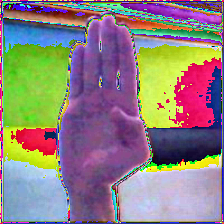

(224, 224, 3) torch.Size([10])
Ground Truth B


In [16]:
from IPython.display import display
from PIL import Image
for img, label in train_dataloader:
    img = img[0].numpy()
    img = img *255
    img = img.astype('uint8')
    img = np.transpose(img, (1, 2, 0))
    display(Image.fromarray(img,'RGB'))
    print(img.shape, label.shape)
    print(f'Ground Truth {classes[label[0]]}')
    break

In [77]:
# for img, label in train_dataloader:
#     print(img.shape, label.shape)
#     print(f'Ground Truth {classes[label[0]]}')
# #     plt.imshow(img[0].permute(1, 2, 0))
#     img = img.numpy()
# #     im = make_grid(img, nrow=1)  
# #     fig = px.imshow(img[0]);
#     fig.show()
#     print(img[0].shape)
#     break
    


In [17]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cpu'

<h3 style="font-size: 20px; color:#0062ac; align: center; text-shadow: 2px 3px  #d9cfd8;">
    <font face ="Product Sans">Model</font></h3>


In [18]:
from torchsummary import summary
resnet = models.resnet50(pretrained=True)

summary(resnet, input_size=(3, 224, 224))

C:\Users\teeja\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\teeja\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

In [19]:
for param in resnet.parameters():
    param.requires_grad = False

In [20]:
resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [22]:
in_features = resnet.fc.in_features
fc = nn.Linear(in_features=in_features, out_features=len(classes))
resnet.fc = fc

In [23]:
resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [24]:
params_to_update = []
for name, param in resnet.named_parameters():
    if param.requires_grad == True:
        params_to_update.append(param)

        
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params_to_update, lr=0.0001)

<h3 style="font-size: 20px; color:#0062ac; align: center; text-shadow: 2px 3px  #d9cfd8;">
    <font face ="Product Sans">Training our model</font></h3>


In [25]:
from time import time
from tqdm import tqdm


def train(model,
          criterion,
          optimizer,
          train_dataloader,
          test_dataloader,
          print_every,
          num_epoch,
          start_epoch = 0,
          start_step = 0):
    steps = start_step
    train_losses, val_losses = [], []

    model.to(device)
    for epoch in tqdm(range(start_epoch, num_epoch)):
        running_loss = 0
        correct_train = 0
        total_train = 0
        start_time = time()
        iter_time = time()
        
        model.train()
        for i, (images, labels) in enumerate(train_dataloader):
            steps += 1
            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            output = model(images)
            loss = criterion(output, labels)

            correct_train += (torch.max(output, dim=1)[1] == labels).sum()
            total_train += labels.size(0)

            # Backward and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            # Logging
            if steps % print_every == 0:
                print(f'Epoch [{epoch + 1}]/[{num_epoch}]. Batch [{i + 1}]/[{len(train_dataloader)}].', end=' ')
                print(f'Train loss {running_loss / steps:.3f}.', end=' ')
                print(f'Train acc {correct_train / total_train * 100:.3f}.', end=' ')
                with torch.no_grad():
                    model.eval()
                    correct_val, total_val = 0, 0
                    val_loss = 0
                    for images, labels in test_dataloader:
                        images = images.to(device)
                        labels = labels.to(device)
                        output = model(images)
                        loss = criterion(output, labels)
                        val_loss += loss.item()

                        correct_val += (torch.max(output, dim=1)[1] == labels).sum()
                        total_val += labels.size(0)

                print(f'Val loss {val_loss / len(test_dataloader):.3f}. Val acc {correct_val / total_val * 100:.3f}.', end=' ')
                print(f'Took {time() - iter_time:.3f} seconds')
                iter_time = time()

                train_losses.append(running_loss / total_train)
                val_losses.append(val_loss / total_val)


        print(f'Epoch took {time() - start_time}') 
        torch.save({
            'epoch': num_epoch,
            'model_state_dict': resnet.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_loss': train_losses,
            'val_loss': val_losses,
            }, f'checkpoint_{correct_val / total_val * 100:.2f}.pth')
        
    return model, train_losses, val_losses

In [26]:
print_every = 50
num_epoch = 3

resnet, train_losses, val_losses = train(
    model=resnet,
    criterion=criterion,
    optimizer=optimizer,
    train_dataloader=train_dataloader,
    test_dataloader=val_dataloader,
    print_every=print_every,
    num_epoch=num_epoch
)

  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

Epoch [1]/[3]. Batch [50]/[894]. Train loss 3.412. Train acc 4.600. Val loss 3.335. Val acc 6.673. Took 493.318 seconds
Epoch [1]/[3]. Batch [100]/[894]. Train loss 3.354. Train acc 5.600. Val loss 3.247. Val acc 11.017. Took 413.707 seconds
Epoch [1]/[3]. Batch [150]/[894]. Train loss 3.305. Train acc 8.867. Val loss 3.163. Val acc 15.495. Took 397.884 seconds
Epoch [1]/[3]. Batch [200]/[894]. Train loss 3.263. Train acc 10.200. Val loss 3.077. Val acc 22.167. Took 399.145 seconds
Epoch [1]/[3]. Batch [250]/[894]. Train loss 3.222. Train acc 11.920. Val loss 2.983. Val acc 24.362. Took 414.443 seconds
Epoch [1]/[3]. Batch [300]/[894]. Train loss 3.180. Train acc 14.133. Val loss 2.899. Val acc 36.364. Took 403.212 seconds
Epoch [1]/[3]. Batch [350]/[894]. Train loss 3.131. Train acc 16.771. Val loss 2.853. Val acc 33.453. Took 398.496 seconds
Epoch [1]/[3]. Batch [400]/[894]. Train loss 3.086. Train acc 20.050. Val loss 2.759. Val acc 36.946. Took 398.139 seconds
Epoch [1]/[3]. Batch 

 33%|██████████████████████████                                                    | 1/3 [2:00:16<4:00:32, 7216.34s/it]

Epoch [2]/[3]. Batch [6]/[894]. Train loss 0.015. Train acc 60.000. Val loss 2.166. Val acc 60.994. Took 346.037 seconds
Epoch [2]/[3]. Batch [56]/[894]. Train loss 0.123. Train acc 64.107. Val loss 2.103. Val acc 63.950. Took 414.714 seconds
Epoch [2]/[3]. Batch [106]/[894]. Train loss 0.220. Train acc 65.189. Val loss 2.053. Val acc 67.040. Took 419.923 seconds
Epoch [2]/[3]. Batch [156]/[894]. Train loss 0.304. Train acc 66.731. Val loss 1.995. Val acc 72.145. Took 412.321 seconds
Epoch [2]/[3]. Batch [206]/[894]. Train loss 0.379. Train acc 67.427. Val loss 1.956. Val acc 68.294. Took 409.633 seconds
Epoch [2]/[3]. Batch [256]/[894]. Train loss 0.446. Train acc 68.320. Val loss 1.929. Val acc 67.219. Took 402.833 seconds
Epoch [2]/[3]. Batch [306]/[894]. Train loss 0.507. Train acc 68.366. Val loss 1.885. Val acc 69.727. Took 413.812 seconds
Epoch [2]/[3]. Batch [356]/[894]. Train loss 0.562. Train acc 68.539. Val loss 1.847. Val acc 71.787. Took 422.926 seconds
Epoch [2]/[3]. Batc

 67%|████████████████████████████████████████████████████                          | 2/3 [4:13:24<2:07:50, 7670.59s/it]

Epoch [3]/[3]. Batch [12]/[894]. Train loss 0.012. Train acc 63.333. Val loss 1.539. Val acc 75.504. Took 419.401 seconds
Epoch [3]/[3]. Batch [62]/[894]. Train loss 0.052. Train acc 76.129. Val loss 1.511. Val acc 76.131. Took 490.987 seconds
Epoch [3]/[3]. Batch [112]/[894]. Train loss 0.090. Train acc 77.411. Val loss 1.487. Val acc 77.609. Took 474.221 seconds
Epoch [3]/[3]. Batch [162]/[894]. Train loss 0.125. Train acc 78.333. Val loss 1.469. Val acc 76.982. Took 488.130 seconds
Epoch [3]/[3]. Batch [212]/[894]. Train loss 0.158. Train acc 77.830. Val loss 1.447. Val acc 77.161. Took 462.823 seconds
Epoch [3]/[3]. Batch [262]/[894]. Train loss 0.189. Train acc 77.977. Val loss 1.415. Val acc 78.549. Took 464.378 seconds
Epoch [3]/[3]. Batch [312]/[894]. Train loss 0.218. Train acc 77.853. Val loss 1.397. Val acc 79.355. Took 468.967 seconds
Epoch [3]/[3]. Batch [362]/[894]. Train loss 0.245. Train acc 78.646. Val loss 1.381. Val acc 77.877. Took 454.003 seconds
Epoch [3]/[3]. Bat

100%|████████████████████████████████████████████████████████████████████████████████| 3/3 [6:30:52<00:00, 7817.58s/it]

Epoch took 8247.674012899399


In [26]:
# checkpoint = torch.load('checkpoint_80.25.pth')
checkpoint = torch.load("checkpoint_80.25.pth")
resnet.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
train_losses = checkpoint['train_loss']
val_losses = checkpoint['val_loss']
num_epoch = checkpoint['epoch']

In [42]:
loaded_model = resnet
epoch=1
loaded_model.train()
train(loaded_model, criterion, optimizer, train_dataloader, val_dataloader, print_every, epoch)

  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

Epoch [1]/[1]. Batch [50]/[894]. Train loss 1.370. Train acc 77.600. Val loss 1.180. Val acc 81.594. Took 451.781 seconds
Epoch [1]/[1]. Batch [100]/[894]. Train loss 1.277. Train acc 79.100. Val loss 1.181. Val acc 79.803. Took 392.026 seconds
Epoch [1]/[1]. Batch [150]/[894]. Train loss 1.234. Train acc 79.533. Val loss 1.158. Val acc 82.042. Took 372.037 seconds
Epoch [1]/[1]. Batch [200]/[894]. Train loss 1.187. Train acc 80.850. Val loss 1.132. Val acc 81.773. Took 366.345 seconds
Epoch [1]/[1]. Batch [250]/[894]. Train loss 1.165. Train acc 81.800. Val loss 1.128. Val acc 81.012. Took 383.135 seconds
Epoch [1]/[1]. Batch [300]/[894]. Train loss 1.156. Train acc 82.033. Val loss 1.117. Val acc 82.266. Took 403.684 seconds
Epoch [1]/[1]. Batch [350]/[894]. Train loss 1.143. Train acc 81.943. Val loss 1.099. Val acc 83.296. Took 390.789 seconds
Epoch [1]/[1]. Batch [400]/[894]. Train loss 1.129. Train acc 82.025. Val loss 1.104. Val acc 80.923. Took 389.984 seconds
Epoch [1]/[1]. Ba

100%|████████████████████████████████████████████████████████████████████████████████| 1/1 [1:50:06<00:00, 6606.74s/it]


(ResNet(
   (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
   (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (relu): ReLU(inplace=True)
   (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
   (layer1): Sequential(
     (0): Bottleneck(
       (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
       (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
       (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
       (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       (relu): ReLU(inplace=True)
       (downsample): Sequential(
         (0): Conv2d(64, 256, kernel_size=(1,

In [27]:

# Create a Figure object
fig = go.Figure()

# Add trace for training losses
fig.add_trace(go.Scatter(x=train_losses, y=train_losses, name='Training loss'))

# Add trace for validation losses
fig.add_trace(go.Scatter(x=val_losses, y=val_losses, name='Validation loss'))

# Set chart title and labels
fig.update_layout(title='Training and Validation Loss', xaxis_title='Epoch', yaxis_title='Loss')

# Show the chart
fig.show()


In [28]:
checkpoint2 = torch.load("checkpoint_84.24.pth")
resnet.load_state_dict(checkpoint2['model_state_dict'])
optimizer.load_state_dict(checkpoint2['optimizer_state_dict'])
train_losses2 = checkpoint2['train_loss']
val_losses2 = checkpoint2['val_loss']
num_epoch2 = checkpoint2['epoch']

In [29]:
# plt.plot(train_losses, label='Training loss')
# plt.plot(val_losses, label='Validation loss')
# plt.legend(frameon=False)            
# plt.show()

import plotly.graph_objects as go

# Create a Figure object
fig = go.Figure()

# Add trace for training losses
fig.add_trace(go.Scatter(x=train_losses2, y=train_losses2, name='Training loss'))

# Add trace for validation losses
fig.add_trace(go.Scatter(x=val_losses2, y=val_losses2, name='Validation loss'))

# Set chart title and labels
fig.update_layout(title='Training and Validation Loss', xaxis_title='Epoch', yaxis_title='Loss')

# Show the chart
fig.show()


In [30]:
from PIL import Image
import os
from torch.utils.data import Dataset


class CustomDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_list = os.listdir(root_dir)

    def __len__(self):
        return len(self.image_list)

    def __getitem__(self, idx):
        img_name = self.image_list[idx]
        img_path = os.path.join(self.root_dir, img_name)
        image = Image.open(img_path)
        label = img_name.split("_")[0]
        if self.transform:
            image = self.transform(image)
        return image, label


In [31]:

test_data_path = Path('../Project/asl_alphabet - Copy/asl_alphabet_test/asl_alphabet_test')

labels = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V',
          'W', 'X', 'Y', 'Z', 'nothing', 'space']
label2int = {label: i for i, label in enumerate(labels)}

# Define test dataset
test_dataset = CustomDataset(test_data_path, transform=test_transforms)

# Set model to evaluation mode
resnet.eval()

# Initialize counters for correct predictions and total predictions
correct = 0
total = 0

# Iterate through test dataset
for images, labels in test_dataset:
    # Make predictions
    output = resnet(images.unsqueeze(0))
    predicted = torch.argmax(output).item()
    label = label2int[labels]
    if label == predicted:
        correct += 1
    total += 1

# Calculate accuracy
accuracy = 100 * correct / total
print(f'Accuracy on test data: {accuracy}%')


<IPython.core.display.Javascript object>

Accuracy on test data: 89.28571428571429%


In [32]:
from pathlib import Path
from PIL import Image


test_data_path = Path('../Project/asl_alphabet - Copy/asl_alphabet_test/asl_alphabet_test/')



class ASLTestDataset(torch.utils.data.Dataset):
    def __init__(self, root_path, transforms=None):
        super().__init__()
        
        self.transforms = transforms
        self.imgs = sorted(list(Path(root_path).glob('*.jpg')))
        
    def __len__(self):
        return len(self.imgs)
    
    def __getitem__(self, idx):
        img_path = self.imgs[idx]
        img = Image.open(img_path).convert('RGB')
        
        label = img_path.parts[-1].split('_')[0]
        if self.transforms:
            img = self.transforms(img)
        
        return img, label

In [54]:
random_idx = random.randint(0, len(test_dataset) - 1)
img, label = test_dataset[random_idx]
img = img.to(device)
resnet.eval()
prediction = resnet(img[None])
img = img.permute(1, 2, 0)
img = (img * 255).numpy().astype('uint8')

fig = go.Figure(data=[go.Image(z=img)])
fig.update_layout(title={'text': f'GT {label}. Pred {classes[torch.max(prediction, dim=1)[1]]}', 'x':0.5, 'xanchor':'center'})
fig.show()


In [37]:
predictions = []
labels = []

resnet.eval()
with torch.no_grad():
    for i, (img, label) in enumerate(test_dataset):
        img = img.to(device)
        prediction = resnet(img[None])
        predictions.append(torch.max(prediction, dim=1)[1].item())
        labels.append(label)